In [1]:
import numpy as np
import scipy.sparse as sps
import porepy as pp

import ddf.common as co
import ddf.hrl as hrl

from ddf.plot import quiver, plot_cells, streamplot
from ddf.immagini import *

from tabulate import tabulate

In [2]:
def run(nome, adaptive_kwargs, vg14_args, impostazioni={}):
    print(nome, end=' ')

    imp = dict(
        cartella='../simulazioni/dir_vg14', nome=nome,
        parla=2, scalari_post=[ hrl.dizionario_post['sherwood'] ], esporta=1
    ) | impostazioni

    pb = co.pkl(imp)
    if pb is None:
        mdg, dati = hrl.vg14(*vg14_args)
        pb = hrl.HRL(mdg, dati, imp)
        pb.init()
        pb.steady_state()
        pb.perturba_cella()
        pb.adaptive(**adaptive_kwargs)
        pb.steady_state()
    return pb

In [3]:
pbs = {}

In [7]:
Ra_1 = 9.988363636363633 # 0.7*0.1*10*1.6e-16*9.81*1000/(0.1*1e-9*1.1e-3)
Ra_c = 4*np.pi**2
ln = {}
ln = { 'P': (1.2) * Ra_c/Ra_1 }
# ln = { 'A': 1/4 * Ra_c/Ra_1, 'B': (1-0.01) * Ra_c/Ra_1, 'C': (1+0.01) * Ra_c/Ra_1, 'D': 1.5 * Ra_c/Ra_1, }
for l,n in ln.items():
    nome = f'0{l}'
    pbs[nome] = run(nome, dict(dt_init=0.01, dt_max=2), ('0', n))

# for n in [1, 3, 4]:
#     nome = f'A{n}'
#     pbs[nome] = run(nome, { 'dt_init': 0.001, 'dt_max': 0.02 }, ('A', n))
pbs['A2'] = run('A2', { 'dt_init': 0.001, 'dt_max': 0.02 }, ('A', 2), dict(stato_freq=4))

# for n in [1, 3, 4]:
#     nome = f'B{n}'
#     pbs[nome] = run(nome, { 'dt_init': 0.001, 'dt_max': 0.02 }, ('B', n))
pbs['B2'] = run('B2', { 'dt_init': 0.001, 'dt_max': 0.02 }, ('B', 2), dict(stato_freq=4))

for n in [1, 2, 3, 4]:
    if n != 2: continue
    nome = f'C{n}'
    pbs[nome] = run(nome, { 'dt_init': 0.005, 'dt_max': 2.5 }, ('C', n))


0P A2 B2 C2 
t = 0.005    dt = 0.005    #iterazioni = 4               dconc = 0.48       sherwood-1 = -1.28e-05
t = 0.01     dt = 0.005    #iterazioni = 3               dconc = 0.01       sherwood-1 = -2.24e-05
t = 0.015    dt = 0.005    #iterazioni = 3               dconc = 0.00089    sherwood-1 = -4.61e-05
t = 0.0203   dt = 0.0053   #iterazioni = 3               dconc = 0.00028    sherwood-1 = -7.92e-05
t = 0.0258   dt = 0.0055   #iterazioni = 3               dconc = 0.00014    sherwood-1 = -0.000115
t = 0.0316   dt = 0.0058   #iterazioni = 3               dconc = 7.8e-05    sherwood-1 = -0.000147
t = 0.0376   dt = 0.0061   #iterazioni = 3               dconc = 4.9e-05    sherwood-1 = -0.00017
t = 0.044    dt = 0.0064   #iterazioni = 2               dconc = 3.3e-05    sherwood-1 = -0.000185
t = 0.0507   dt = 0.0067   #iterazioni = 2               dconc = 2.3e-05    sherwood-1 = -0.000191
t = 0.0577   dt = 0.007    #iterazioni = 2               dconc = 1.7e-05    sherwood-1 = -0.00019

In [8]:
for n in 1+np.arange(12):
    if n in [5,11]: continue
    if n != 7: continue
    nome = f'D{n}'
    pbs[nome] = run(nome, { 'dt_init': 0.001, 'dt_max': 0.05 }, ('D', n))
# pbs['D5'] = run('D5', { 'dt_init': 0.001, 'dt_max': 0.05 }, ('D', 5), dict(stato_freq=1))
# pbs['D11'] = run('D11', { 'dt_init': 0.001, 'dt_max': 0.05 }, ('D', 11), dict(stato_freq=3))

# nome = 'E9a'
# pbs[nome] = run(nome, { 'dt_init': 0.005, 'dt_max': 0.1 }, ('E', '9a'), dict(stato_freq=1))

nome = 'E9b'
pbs[nome] = run(nome, { 'dt_init': 0.001, 'dt_max': 0.1 }, ('E', '9b'), dict(stato_freq=1))

D7 

c:\set.iit\v\p\ddf_p\ddf_p\porepy\src\porepy\grids\mortar_grid.py:693: UserWarning: Is it really meaningful to ask for signs of a one sided mortar grid?
  warnings.warn(


t = 0.001    dt = 0.001    #iterazioni = 4               dconc = 0.44       sherwood-1 = 1.45e-06
t = 0.002    dt = 0.001    #iterazioni = 3               dconc = 0.051      sherwood-1 = 1.44e-06
t = 0.003    dt = 0.001    #iterazioni = 3               dconc = 0.0094     sherwood-1 = 1.36e-06
t = 0.00405  dt = 0.0011   #iterazioni = 3               dconc = 0.0031     sherwood-1 = 1.07e-06
t = 0.00515  dt = 0.0011   #iterazioni = 3               dconc = 0.0015     sherwood-1 = 2.33e-07
t = 0.00631  dt = 0.0012   #iterazioni = 3               dconc = 0.00087    sherwood-1 = -1.66e-06
t = 0.00753  dt = 0.0012   #iterazioni = 3               dconc = 0.00077    sherwood-1 = -5.26e-06
t = 0.0088   dt = 0.0013   #iterazioni = 3               dconc = 0.0013     sherwood-1 = -1.11e-05
t = 0.0101   dt = 0.0013   #iterazioni = 4               dconc = 0.0021     sherwood-1 = -1.9e-05
t = 0.0114   dt = 0.0013   #iterazioni = 4               dconc = 0.0034     sherwood-1 = -2.65e-05
t = 0.0126   dt 

In [15]:
sh = { nome: pbs[nome].chiudi_scalari()['sherwood'][-1] for nome in pbs.keys() }
sh_vg14 = hrl.sh_vg14

tabella = [
    { 'nome': nome, 'vg14': sh_vg14[nome], 'pp': sh[nome], 'eps': (sh[nome] - sh_vg14[nome])/sh_vg14[nome] }
    for nome in sh_vg14.keys() if nome in sh.keys()
]
print(tabulate(tabella, floatfmt=".2f", headers='keys'))
# for r in tabella: print(f'{r["nome"]:<5} & {r["vg14"]:>5.2f} & {r["pp"]:>5.2f} & {r["eps"]:>8.2f}  \\\\')

nome      vg14    pp    eps
------  ------  ----  -----
A1        1.00  1.00  -0.00
A2        1.36  1.38   0.01
A3        1.56  1.77   0.14
A4        1.75  1.79   0.02
B1        1.00  1.00  -0.00
B2        1.13  1.18   0.04
B3        1.49  1.19  -0.20
B4        1.32  1.29  -0.03
C1        1.00  1.00  -0.00
C2        1.17  1.02  -0.13
C3        1.21  1.06  -0.13
C4        1.21  1.13  -0.06
D1        1.08  1.08  -0.00
D2        1.00  1.00  -0.00
D3        1.00  1.00  -0.00
D4        1.01  1.02   0.01
D5        1.07  1.06  -0.01
D6        1.08  1.09   0.01
D7        1.28  1.27  -0.01
D8        1.15  1.16   0.01
D9        1.15  1.16   0.01
D10       1.45  1.45   0.00
D11       1.37  1.37   0.00
D12       1.39  1.39   0.00
E9a       1.06  1.08   0.02
E9b       2.69  2.92   0.09


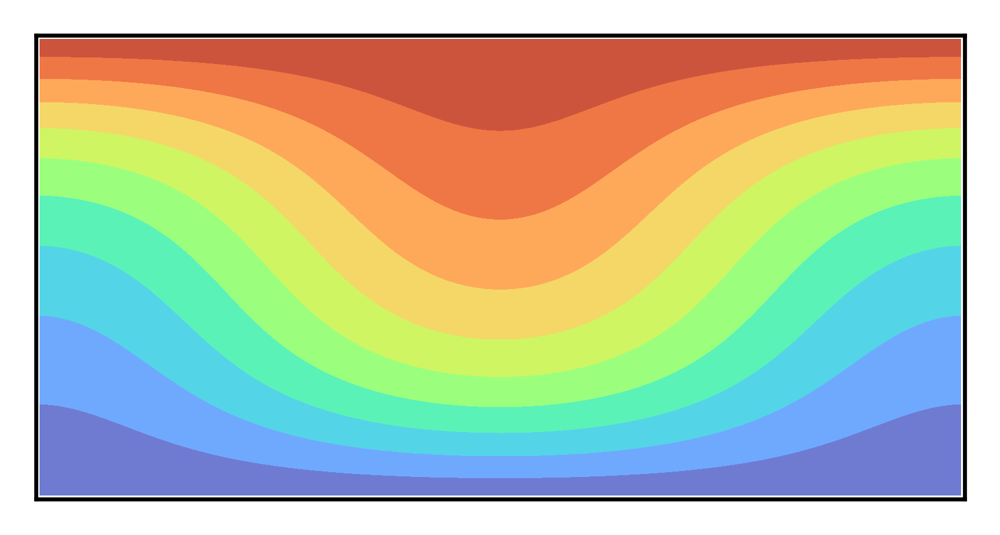

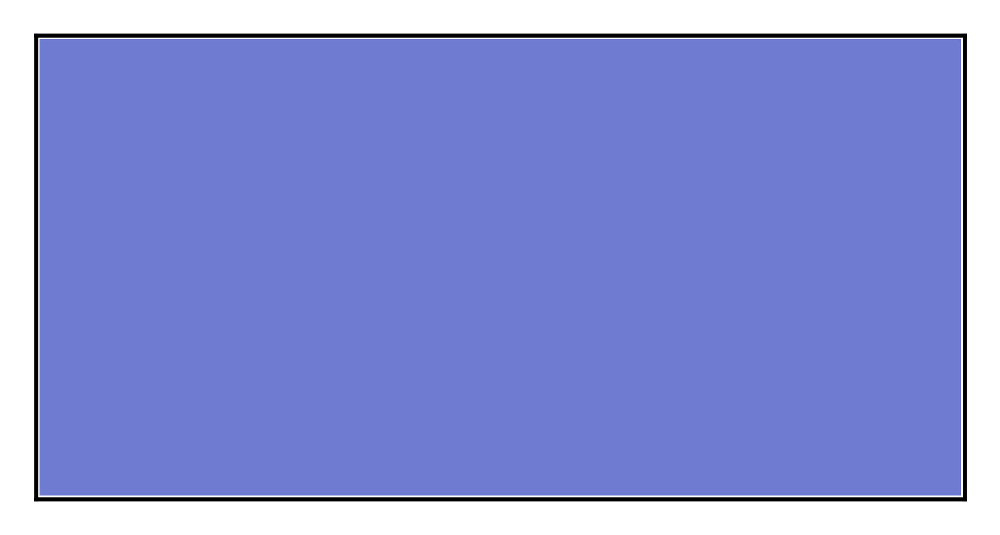

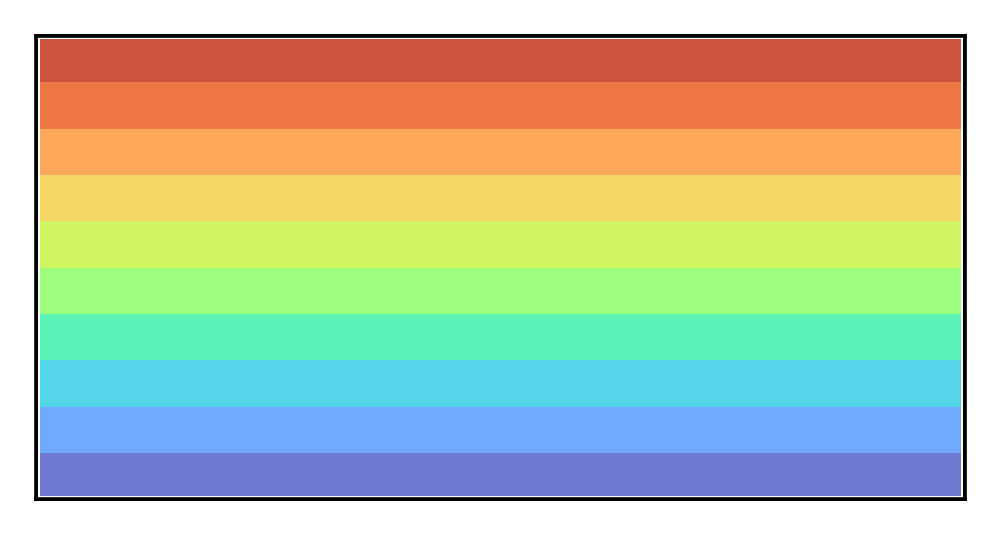

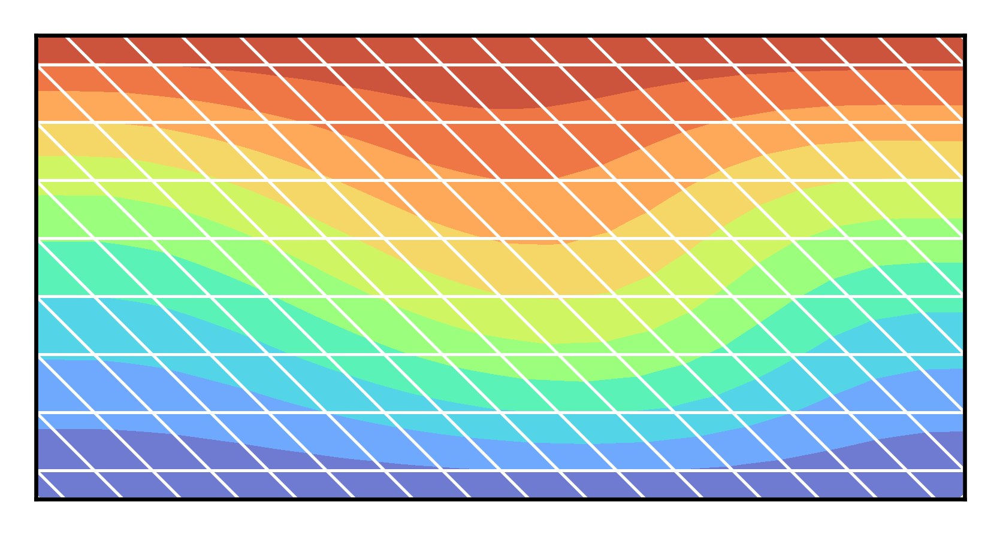

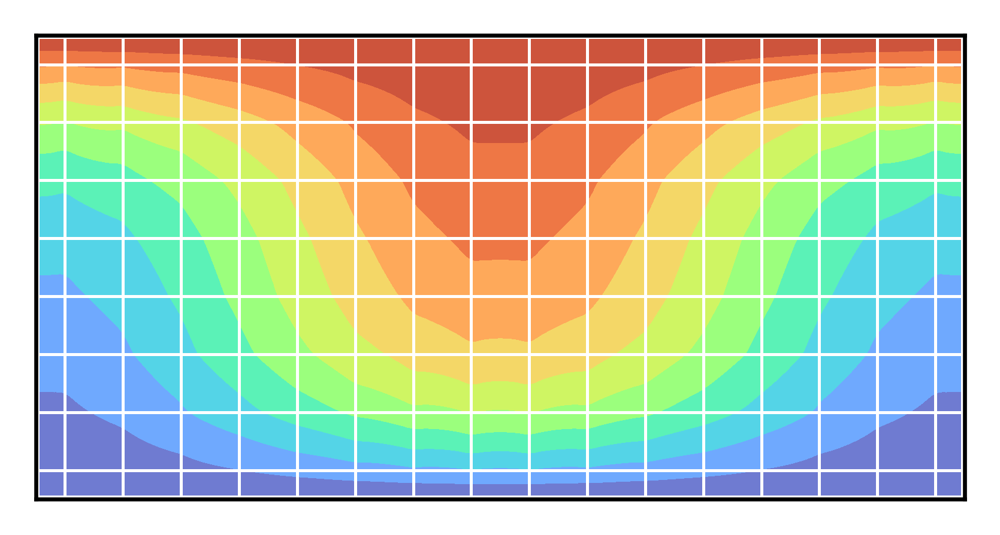

In [6]:
fig,ax = plt.subplots(figsize=(linewidth*.5, linewidth*.5/2))
plot_cells(pbs['0P'], 'concentrazione', ax=ax, **pc_w)
fig.savefig('../immagini/dir_0P.png', **sf_kw)

fig,ax = plt.subplots(figsize=(linewidth*.5, linewidth*.5/2))
plot_cells(pbs['0P'], np.zeros(pbs['0P'].mdg.num_subdomain_cells()), ax=ax, **pc_w)
fig.savefig('../immagini/dir_00.png', **sf_kw)

fig,ax = plt.subplots(figsize=(linewidth*.5, linewidth*.5/2))
plot_cells(pbs['A1'], 'concentrazione', ax=ax, **pc_w)
fig.savefig('../immagini/dir_A1.png', **sf_kw)

fig,ax = plt.subplots(figsize=(linewidth*.5, linewidth*.5/2))
plot_cells(pbs['C4'], 'concentrazione', fratture_lw=0.6, ax=ax, **pc_w)
fig.savefig('../immagini/dir_C4.png', **sf_kw)

fig,ax = plt.subplots(figsize=(linewidth*.5, linewidth*.5/2))
plot_cells(pbs['A4'], 'concentrazione', fratture_lw=0.6, ax=ax, **pc_w)
fig.savefig('../immagini/dir_A4.png', **sf_kw)

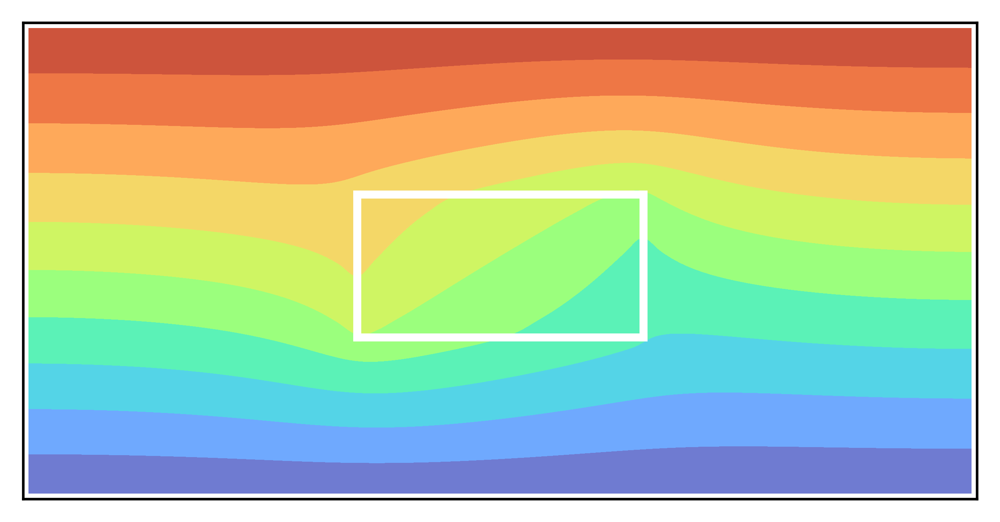

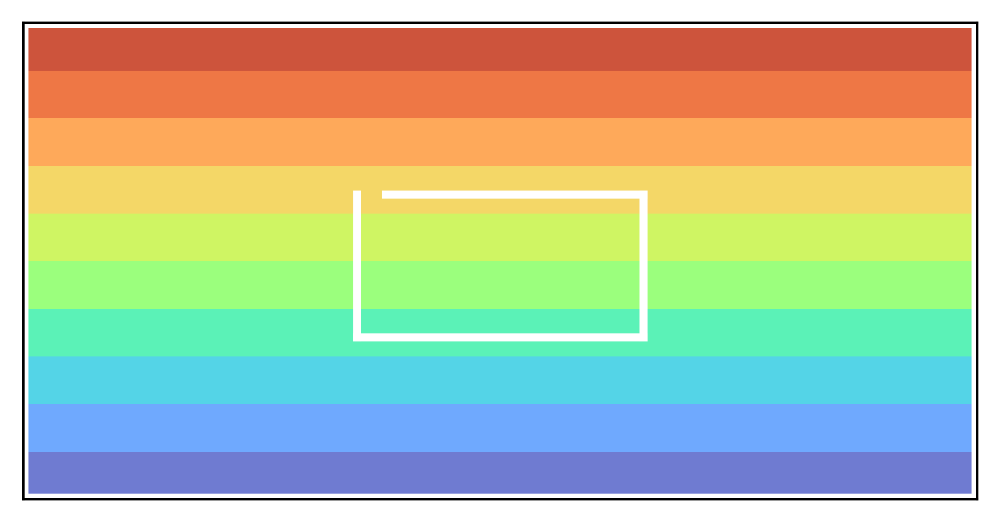

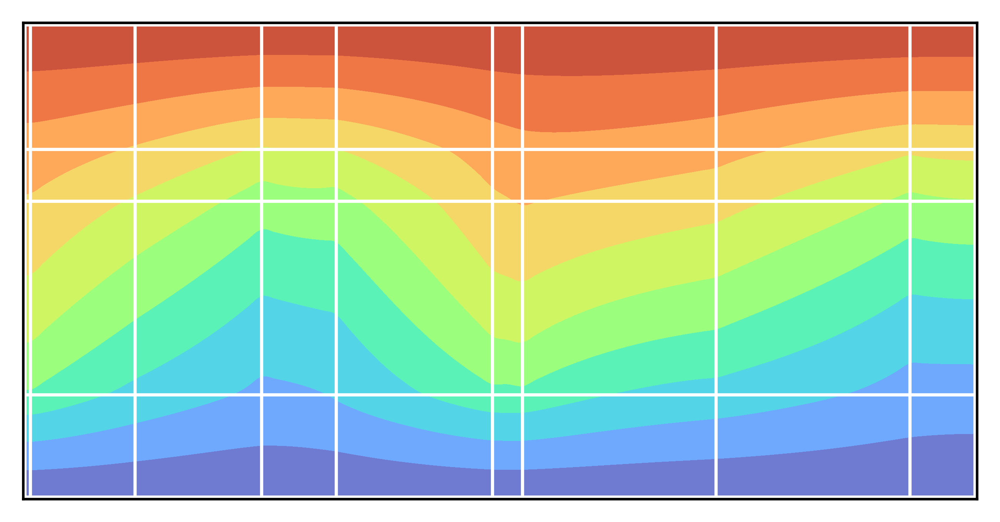

In [23]:
fig,ax = plt.subplots(figsize=(linewidth*.8, linewidth*.8/2))
plot_cells(pbs['D1'], 'concentrazione', fratture_lw=2.5, ax=ax, **pc_w)
fig.savefig('../immagini/dir_D1.png', **sf_kw)

fig,ax = plt.subplots(figsize=(linewidth*.8, linewidth*.8/2))
plot_cells(pbs['D2'], 'concentrazione', fratture_lw=2.5, ax=ax, **pc_w)
fig.savefig('../immagini/dir_D2.png', **sf_kw)

fig,ax = plt.subplots(figsize=(linewidth*.8, linewidth*.8/2))
plot_cells(pbs['B3'], 'concentrazione', fratture_lw=1, ax=ax, **pc_w)
fig.savefig('../immagini/dir_B2.png', **sf_kw)

In [7]:
kw = { 'fratture_lw': 0.5, 'method': 'cubic', 'Nx': 512, 'cmap': cmap_w }
# kw = { 'fill': 0, 'fratture_lw': 0.1, 'colors': 'black', 'linestyles': 'solid', 'Nx': 512, 'levels': np.linspace(0, 1, 11), 'linewidths': 0.8, 'method': 'cubic' }

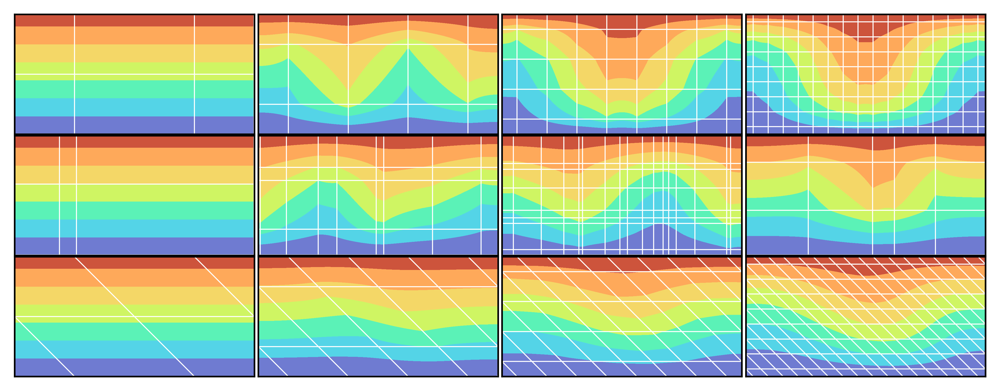

In [19]:
fig,axs = plt.subplots(3, 4, figsize=(linewidth, linewidth/4/2*3))
for j,nome in enumerate([ n for n in pbs.keys() if 'A' in n ]): plot_cells( pbs[f'A{j+1}'], 'concentrazione', ax=axs[0,j], **kw)
for j,nome in enumerate([ n for n in pbs.keys() if 'B' in n ]): plot_cells( pbs[nome], 'concentrazione', ax=axs[1,j], **kw)
for j,nome in enumerate([ n for n in pbs.keys() if 'C' in n ]): plot_cells( pbs[nome], 'concentrazione', ax=axs[2,j], **kw)
fig.tight_layout(pad=0.1)

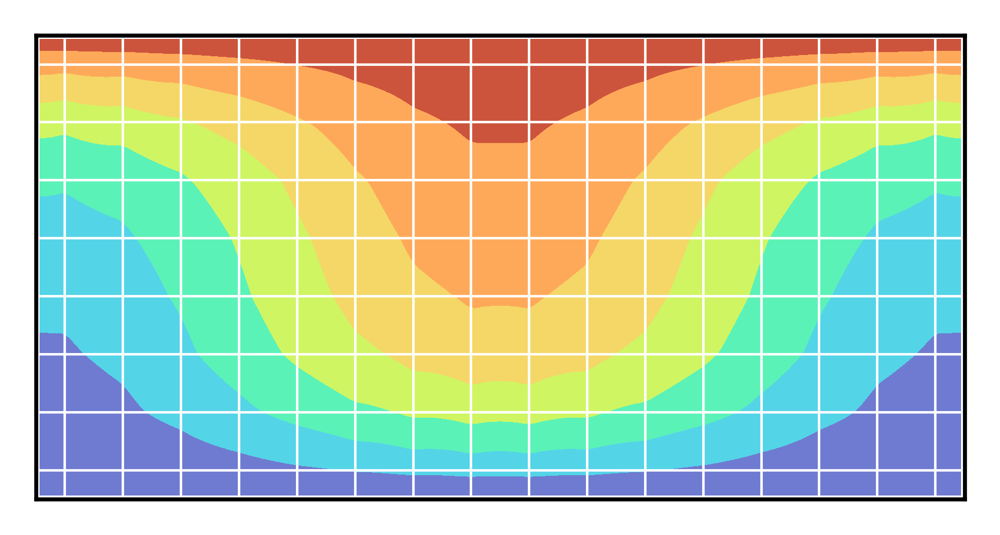

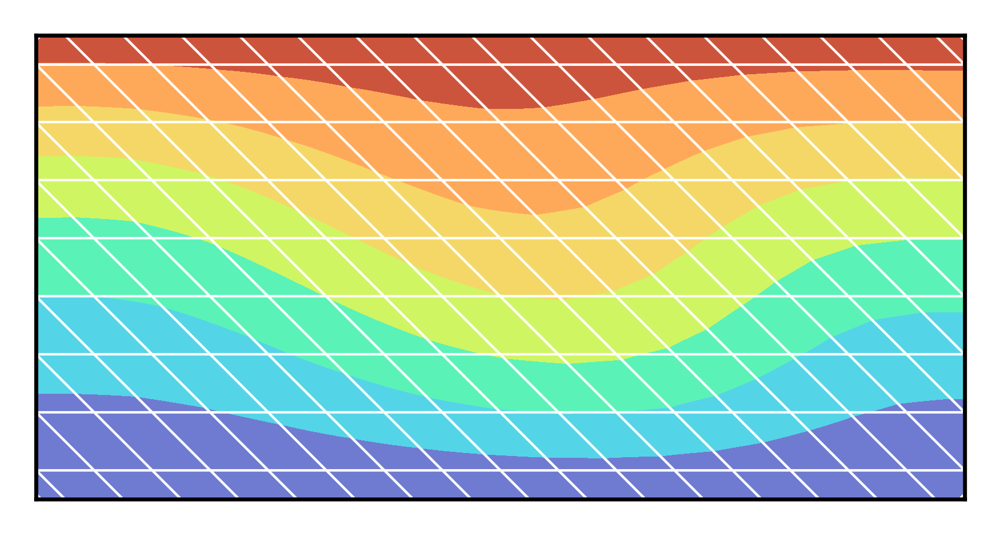

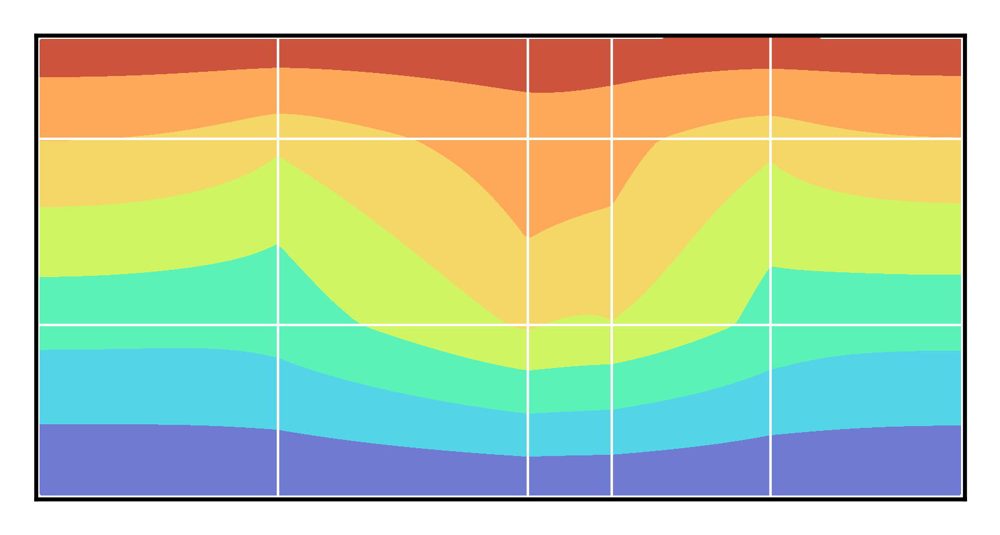

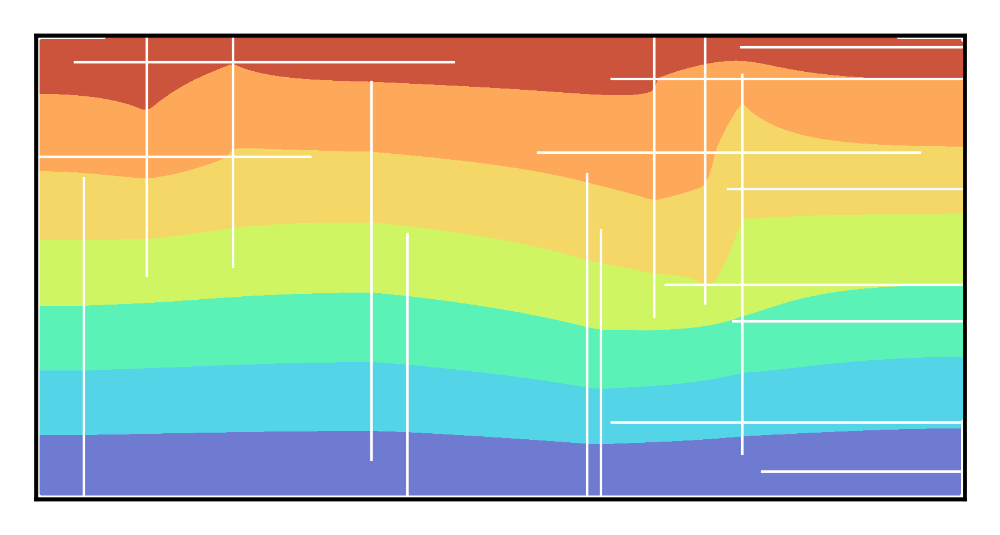

In [27]:
fig,ax = plt.subplots(figsize=(linewidth/2, linewidth/2/2))
plot_cells( pbs['A4'], 'concentrazione', ax=ax, **kw)
fig.savefig('../immagini/A4.png', **sf_kw)

fig,ax = plt.subplots(figsize=(linewidth/2, linewidth/2/2))
plot_cells( pbs['C4'], 'concentrazione', ax=ax, **kw)
fig.savefig('../immagini/C4.png', **sf_kw)

fig,ax = plt.subplots(figsize=(linewidth/2, linewidth/2/2))
plot_cells( pbs['B2'], 'concentrazione', ax=ax, **kw)
fig.savefig('../immagini/B2.png', **sf_kw)

fig,ax = plt.subplots(figsize=(linewidth/2, linewidth/2/2))
plot_cells( pbs['E9a'], 'concentrazione', ax=ax, **kw)
fig.savefig('../immagini/E9a.png', **sf_kw)

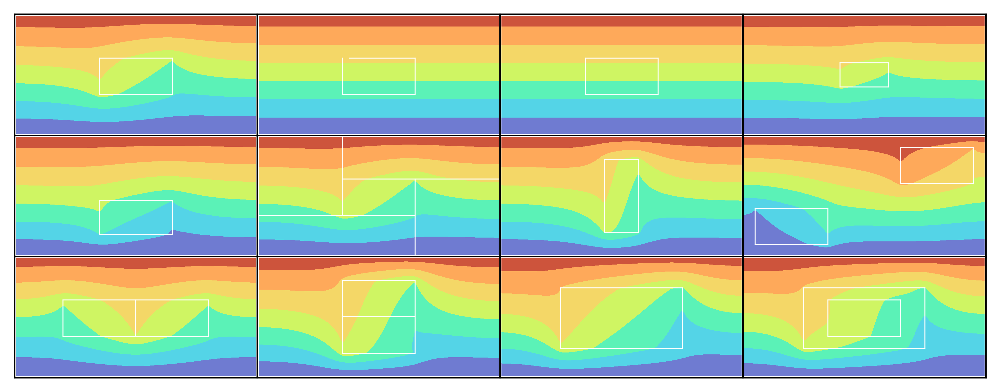

In [9]:
fig,axs = plt.subplots(3,4, figsize=(linewidth, 3*linewidth/8))
for i,nome in enumerate([ f'D{n}' for n in range(1,12+1) if f'D{n}' in pbs.keys() ]):
    plot_cells( pbs[nome], 'concentrazione', ax=axs.flatten()[i], **kw)
fig.tight_layout(pad=0)

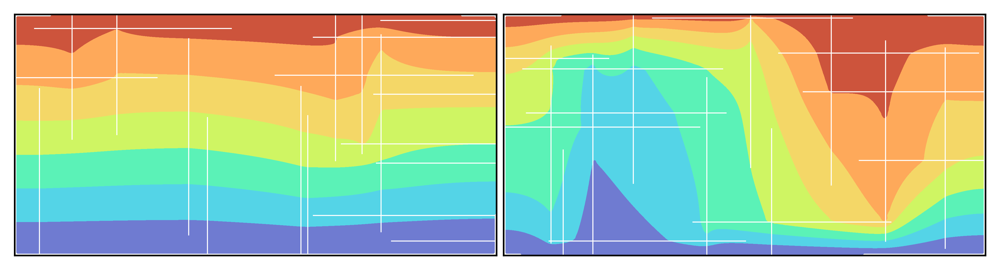

In [10]:
fig,axs = plt.subplots(1,2, figsize=(linewidth, linewidth/2/2))
plot_cells( pbs['E9a'], 'concentrazione', ax=axs[0], **kw)
plot_cells( pbs['E9b'], 'concentrazione', ax=axs[1], **kw)
fig.tight_layout(pad=0.1)

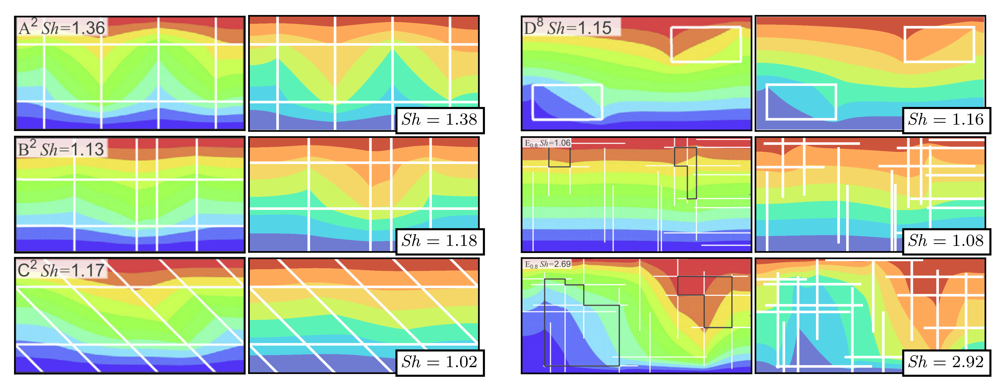

In [21]:
w = .15
fig,axs = plt.subplots(3,5,figsize=(linewidth*0.99, linewidth/(4+w)/2*3*1.03), width_ratios=[1, 1, w, 1, 1], subplot_kw=dict(xticks=[], yticks=[]))
for i in range(3): axs[i,2].set_axis_off()

def c(img): 
    a = np.array(img); b = 0.2
    a[:,:,0:3] = b*255 + (1-b)*a[:,:,0:3]
    return a

bbox = dict(facecolor='white', boxstyle='square,pad=0.3', edgecolor='black')

kwuu = kw|dict(fratture_lw=1.25)
axs[0,0].imshow(c(Image.open('../dati/A2.png')))
plot_cells( pbs['A2'], 'concentrazione', ax=axs[0,1], **kwuu)
axs[0,1].text(20, 0.5, r'$ \mathit{Sh} = %.2f $' % sh['A2'], fontsize='small', ha='right', bbox=bbox)

axs[1,0].imshow(c(Image.open('../dati/B2.png'))); 
plot_cells( pbs['B2'], 'concentrazione', ax=axs[1,1], **kwuu)
axs[1,1].text(20, 0.5, r'$ \mathit{Sh} = %.2f $' % sh['B2'], fontsize='small', ha='right', bbox=bbox)

axs[2,0].imshow(c(Image.open('../dati/C2.png'))); 
plot_cells( pbs['C2'], 'concentrazione', ax=axs[2,1], **kwuu)
axs[2,1].text(20, 0.5, r'$ \mathit{Sh} = %.2f $' % sh['C2'], fontsize='small', ha='right', bbox=bbox)

axs[0,3].imshow(c(Image.open('../dati/D8.png'))); 
plot_cells( pbs['D8'], 'concentrazione', ax=axs[0,4], **kwuu)
axs[0,4].text(20, 0.5, r'$ \mathit{Sh} = %.2f $' % sh['D8'], fontsize='small', ha='right', bbox=bbox)

axs[1,3].imshow(c(Image.open('../dati/E9a.png'))); 
plot_cells( pbs['E9a'], 'concentrazione', ax=axs[1,4], **kwuu)
axs[1,4].text(20, 0.5, r'$ \mathit{Sh} = %.2f $' % sh['E9a'], fontsize='small', ha='right', bbox=bbox)

axs[2,3].imshow(c(Image.open('../dati/E9b.png'))); 
plot_cells( pbs['E9b'], 'concentrazione', ax=axs[2,4], **kwuu)
axs[2,4].text(20, 0.5, r'$ \mathit{Sh} = %.2f $' % sh['E9b'], fontsize='small', ha='right', bbox=bbox)


fig.tight_layout(pad=0.2)
fig.savefig('../immagini/vg14_val.png', **sf_kw|dict(pad_inches=0.05))

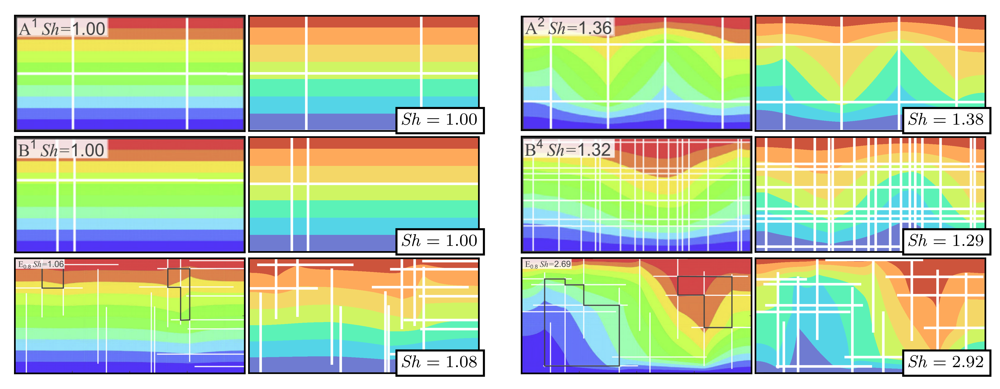

In [8]:
w = .15
fig,axs = plt.subplots(3,5,figsize=(linewidth*0.99, linewidth/(4+w)/2*3*1.03), width_ratios=[1, 1, w, 1, 1], subplot_kw=dict(xticks=[], yticks=[]))
for i in range(3): axs[i,2].set_axis_off()

def c(img): 
    a = np.array(img); b = 0.2
    a[:,:,0:3] = b*255 + (1-b)*a[:,:,0:3]
    return a

bbox = dict(facecolor='white', boxstyle='square,pad=0.3', edgecolor='black')

kwuu = kw|dict(fratture_lw=1.25)
axs[0,0].imshow(c(Image.open('../dati/A1.png')))
plot_cells( pbs['A1'], 'concentrazione', ax=axs[0,1], **kwuu)
axs[0,1].text(20, 0.5, r'$ \mathit{Sh} = %.2f $' % sh['A1'], fontsize='small', ha='right', bbox=bbox)

axs[1,0].imshow(c(Image.open('../dati/B1.png'))); 
plot_cells( pbs['B1'], 'concentrazione', ax=axs[1,1], **kwuu)
axs[1,1].text(20, 0.5, r'$ \mathit{Sh} = %.2f $' % sh['B1'], fontsize='small', ha='right', bbox=bbox)

axs[2,0].imshow(c(Image.open('../dati/E9a.png'))); 
plot_cells( pbs['E9a'], 'concentrazione', ax=axs[2,1], **kwuu)
axs[2,1].text(20, 0.5, r'$ \mathit{Sh} = %.2f $' % sh['E9a'], fontsize='small', ha='right', bbox=bbox)

axs[0,3].imshow(c(Image.open('../dati/A2.png'))); 
plot_cells( pbs['A2'], 'concentrazione', ax=axs[0,4], **kwuu)
axs[0,4].text(20, 0.5, r'$ \mathit{Sh} = %.2f $' % sh['A2'], fontsize='small', ha='right', bbox=bbox)

axs[1,3].imshow(c(Image.open('../dati/B4.png'))); 
plot_cells( pbs['B4'], 'concentrazione', ax=axs[1,4], **kwuu)
axs[1,4].text(20, 0.5, r'$ \mathit{Sh} = %.2f $' % sh['B4'], fontsize='small', ha='right', bbox=bbox)

axs[2,3].imshow(c(Image.open('../dati/E9b.png'))); 
plot_cells( pbs['E9b'], 'concentrazione', ax=axs[2,4], **kwuu)
axs[2,4].text(20, 0.5, r'$ \mathit{Sh} = %.2f $' % sh['E9b'], fontsize='small', ha='right', bbox=bbox)

fig.tight_layout(pad=0.2)
fig.savefig('../immagini/vg14_valp.png', **sf_kw|dict(pad_inches=0.05))

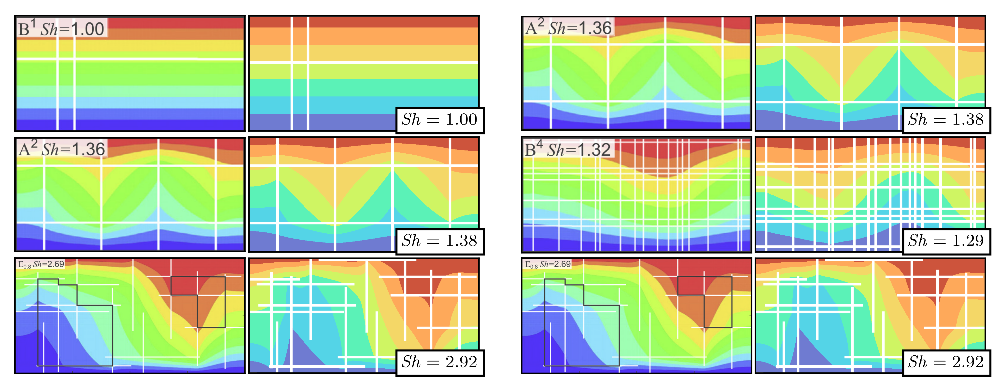

In [9]:
w = .15
fig,axs = plt.subplots(3,5,figsize=(linewidth*0.99, linewidth/(4+w)/2*3*1.03), width_ratios=[1, 1, w, 1, 1], subplot_kw=dict(xticks=[], yticks=[]))
for i in range(3): axs[i,2].set_axis_off()

def c(img): 
    a = np.array(img); b = 0.2
    a[:,:,0:3] = b*255 + (1-b)*a[:,:,0:3]
    return a

bbox = dict(facecolor='white', boxstyle='square,pad=0.3', edgecolor='black')

kwuu = kw|dict(fratture_lw=1.25)
axs[0,0].imshow(c(Image.open('../dati/B1.png')))
plot_cells( pbs['B1'], 'concentrazione', ax=axs[0,1], **kwuu)
axs[0,1].text(20, 0.5, r'$ \mathit{Sh} = %.2f $' % sh['B1'], fontsize='small', ha='right', bbox=bbox)

axs[1,0].imshow(c(Image.open('../dati/A2.png'))); 
plot_cells( pbs['A2'], 'concentrazione', ax=axs[1,1], **kwuu)
axs[1,1].text(20, 0.5, r'$ \mathit{Sh} = %.2f $' % sh['A2'], fontsize='small', ha='right', bbox=bbox)

axs[2,0].imshow(c(Image.open('../dati/E9b.png'))); 
plot_cells( pbs['E9b'], 'concentrazione', ax=axs[2,1], **kwuu)
axs[2,1].text(20, 0.5, r'$ \mathit{Sh} = %.2f $' % sh['E9b'], fontsize='small', ha='right', bbox=bbox)

axs[0,3].imshow(c(Image.open('../dati/A2.png'))); 
plot_cells( pbs['A2'], 'concentrazione', ax=axs[0,4], **kwuu)
axs[0,4].text(20, 0.5, r'$ \mathit{Sh} = %.2f $' % sh['A2'], fontsize='small', ha='right', bbox=bbox)

axs[1,3].imshow(c(Image.open('../dati/B4.png'))); 
plot_cells( pbs['B4'], 'concentrazione', ax=axs[1,4], **kwuu)
axs[1,4].text(20, 0.5, r'$ \mathit{Sh} = %.2f $' % sh['B4'], fontsize='small', ha='right', bbox=bbox)

axs[2,3].imshow(c(Image.open('../dati/E9b.png'))); 
plot_cells( pbs['E9b'], 'concentrazione', ax=axs[2,4], **kwuu)
axs[2,4].text(20, 0.5, r'$ \mathit{Sh} = %.2f $' % sh['E9b'], fontsize='small', ha='right', bbox=bbox)

fig.tight_layout(pad=0.2)
fig.savefig('../immagini/vg14_valpp.png', **sf_kw|dict(pad_inches=0.05))

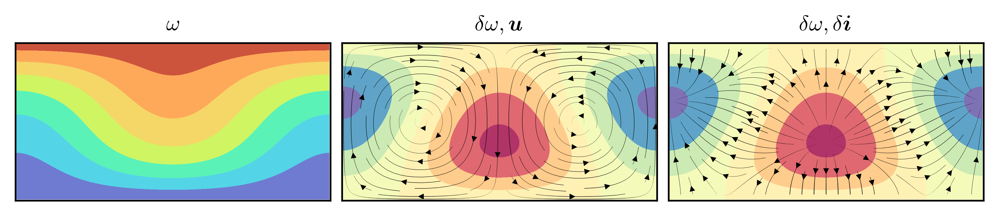

In [12]:
pb = pbs['0P']
c = pb._ultimo_steady_state[pb.dof['concentrazione']] - pb._primo_steady_state[pb.dof['concentrazione']]
vi = co.raccogli_stato_vec(pb.mdg, 'vi')
vi[1,:] += 1

fig,axs = plt.subplots(1,3, figsize=(linewidth*.95, linewidth*.95/6*1.1))
plot_cells( pb, 'concentrazione', ax=axs[0], **kw)
axs[0].set_title('$ \omega $')

plot_cells( pb, c, ax=axs[1], **kw|dict(cmap=cmap_dw))
streamplot( pb, 'vu', ax=axs[1], density=0.9, max_lw=0.2, soglia=0.05)
axs[1].set_title(r'$ \delta\omega, \boldsymbol{u} $')

plot_cells( pb, c, ax=axs[2], **kw|dict(cmap=cmap_dw))
streamplot( pb, vi, ax=axs[2], density=0.9, max_lw=0.3)
axs[2].set_title(r'$ \delta\omega, \delta \boldsymbol{i} $')

fig.tight_layout(pad=0.2)
fig.savefig('../immagini/ra.png', **sf_kw)

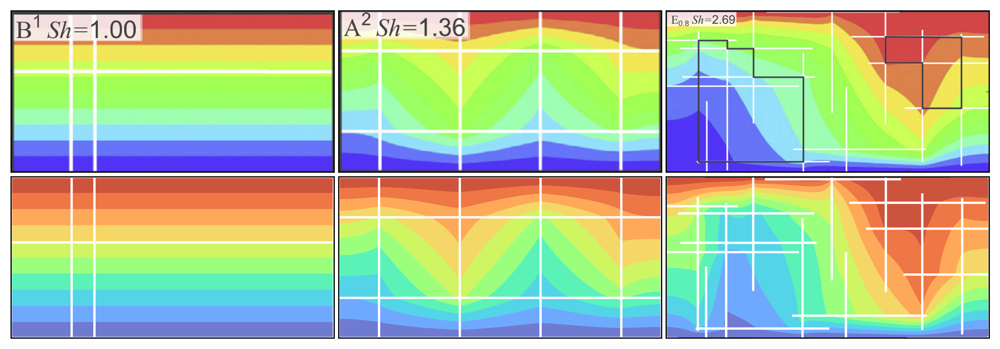

In [46]:
fig,axs = plt.subplots(2,3,figsize=(linewidth*4/3, linewidth*4/3 /3/2*2 * 1.05 ), subplot_kw=dict(xticks=[], yticks=[]))

bbox = dict(facecolor='white', boxstyle='square,pad=0.4', edgecolor='black')

def c(img): 
    a = np.array(img); b = 0.2
    a[:,:,0:3] = b*255 + (1-b)*a[:,:,0:3]
    return a

axs[0,0].imshow(c(Image.open('../dati/B1.png')), extent=[0, 20, 0, 10])
axs[0,1].imshow(c(Image.open('../dati/A2.png')), extent=[0, 20, 0, 10])
axs[0,2].imshow(c(Image.open('../dati/E9b.png')), extent=[0, 20, 0, 10])

plot_cells( pbs['B1'], 'concentrazione', ax=axs[1,0], fratture_lw=1.5, **pc_w)
plot_cells( pbs['A2'], 'concentrazione', ax=axs[1,1], fratture_lw=1.5, **pc_w)
plot_cells( pbs['E9b'], 'concentrazione', ax=axs[1,2], fratture_lw=1.5, **pc_w)

# axs[1,0].text(0.7, 0.7, r'$ \mathit{Sh} = %.2f $' % sh['B1'], fontsize=16, ha='left',  va='bottom', bbox=bbox)
# axs[1,1].text(0.7, 0.7, r'$ \mathit{Sh} = %.2f $' % sh['A2'], fontsize=16, ha='left',  va='bottom', bbox=bbox)
# axs[1,2].text(0.7, 0.7, r'$ \mathit{Sh} = %.2f $' % sh['E9b'], fontsize=16, ha='left', va='bottom',  bbox=bbox)

# axs[0,0].text(0.7, 9.3, r'$ \mathit{Sh} = %.2f $' % sh_vg14['B1'], fontsize=16, ha='left', va='top', bbox=bbox)
# axs[0,1].text(0.7, 9.3, r'$ \mathit{Sh} = %.2f $' % sh_vg14['A2'], fontsize=16, ha='left', va='top', bbox=bbox)
# axs[0,2].text(0.7, 9.3, r'$ \mathit{Sh} = %.2f $' % sh_vg14['E9b'], fontsize=16, ha='left', va='top', bbox=bbox)


fig.tight_layout(pad=0.3)
fig.savefig('../immagini/vg14_pres.png', **sf_kw)

# fig.savefig('../immagini/vg14_valp.png', **sf_kw|dict(pad_inches=0.05))

In [51]:
np.linalg.norm(pb_eig._eig.funs[:,0], np.inf)

0.10002836558024808

-9.86628911524782
51.9172630025203
493.5953301423068


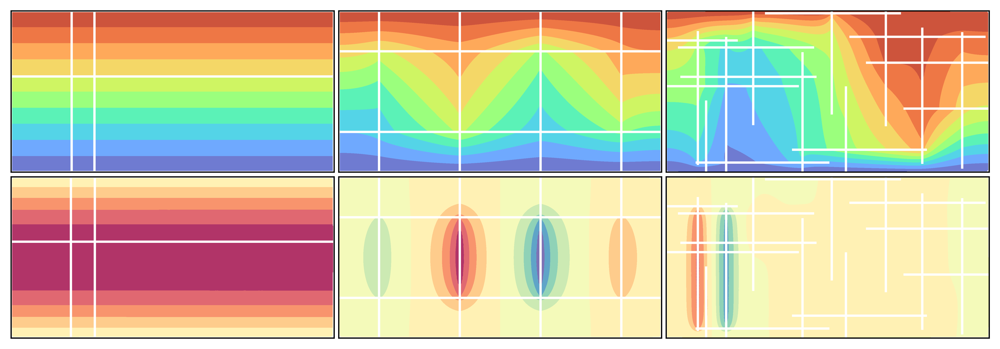

In [55]:
fig,axs = plt.subplots(2,3,figsize=(linewidth*4/3, linewidth*4/3 /3/2*2 * 1.05 ), subplot_kw=dict(xticks=[], yticks=[]))

bbox = dict(facecolor='white', boxstyle='square,pad=0.4', edgecolor='black')

plot_cells( pbs['B1'], 'concentrazione', ax=axs[0,0], fratture_lw=1.5, **pc_w)
plot_cells( pbs['A2'], 'concentrazione', ax=axs[0,1], fratture_lw=1.5, **pc_w)
plot_cells( pbs['E9b'], 'concentrazione', ax=axs[0,2], fratture_lw=1.5, **pc_w)

pb_eig = co.pkl(dict(cartella='../simulazioni/eig_vg14', nome='B1'))
print(pb_eig._eig.vals[0])
n = np.linalg.norm(pb_eig._eig.funs[:,0], np.inf)
plot_cells( pb_eig, pb_eig._eig.funs[:,0], ax=axs[1,0], fratture_lw=1.5, cmap=cmap_dw, vmin=-n, vmax=n, levels=10)

pb_eig = co.pkl(dict(cartella='../simulazioni/eig_vg14', nome='A2'))
print(pb_eig._eig.vals[0])
n = np.linalg.norm(pb_eig._eig.funs[:,0], np.inf)
plot_cells( pb_eig, pb_eig._eig.funs[:,0], ax=axs[1,1], fratture_lw=1.5, cmap=cmap_dw, vmin=-n, vmax=n, levels=10)

pb_eig = co.pkl(dict(cartella='../simulazioni/eig_vg14', nome='E9b'))
print(pb_eig._eig.vals[0])
n = np.linalg.norm(pb_eig._eig.funs[:,0], np.inf)
plot_cells( pb_eig, pb_eig._eig.funs[:,0], ax=axs[1,2], fratture_lw=1.5, cmap=cmap_dw, vmin=-n, vmax=n, levels=10)


# axs[1,0].text(0.7, 0.7, r'$ \mathit{Sh} = %.2f $' % sh['B1'], fontsize=16, ha='left',  va='bottom', bbox=bbox)
# axs[1,1].text(0.7, 0.7, r'$ \mathit{Sh} = %.2f $' % sh['A2'], fontsize=16, ha='left',  va='bottom', bbox=bbox)
# axs[1,2].text(0.7, 0.7, r'$ \mathit{Sh} = %.2f $' % sh['E9b'], fontsize=16, ha='left', va='bottom',  bbox=bbox)

# axs[0,0].text(0.7, 9.3, r'$ \mathit{Sh} = %.2f $' % sh_vg14['B1'], fontsize=16, ha='left', va='top', bbox=bbox)
# axs[0,1].text(0.7, 9.3, r'$ \mathit{Sh} = %.2f $' % sh_vg14['A2'], fontsize=16, ha='left', va='top', bbox=bbox)
# axs[0,2].text(0.7, 9.3, r'$ \mathit{Sh} = %.2f $' % sh_vg14['E9b'], fontsize=16, ha='left', va='top', bbox=bbox)


fig.tight_layout(pad=0.3)
fig.savefig('../immagini/vg14_eigc.png', **sf_kw)

# fig.savefig('../immagini/vg14_valp.png', **sf_kw|dict(pad_inches=0.05))

In [13]:
# # imp = dict(parla=4)
# # mdg, dati = hrl.vg14('D', '7*')
# # pb = hrl.HRL(mdg, dati, imp)
# # pb.init()
# # pb.steady_state()
# # pb.eig(k=1).vals
# pbs['D7*'] = run('D7*', { 'dt_init': 0.005, 'dt_max': 0.5 }, ('D', '7*'), impostazioni=dict(cartella='../simulazioni/misc'))

# def Ra(pb, w, h):
#     H = 10
#     d = pb.dati; c = pb.car; a = w/h
#     Ub = d['permeabilita_fratture']*d['rho_w']*d['alpha']*d['concentrazione_max']*h*d['g']*d['apertura'] /( d['porosita_matrice']*d['viscosita']*H )
#     return Ub
# #     return c['Ra'] * d['permeabilita_fratture']/d['permeabilita_matrice'] * h*d['apertura']/H * np.sqrt(1+a*a)/min(1,a)

# fig,axs = plt.subplots(2,2, figsize=(linewidth,linewidth/2))
# axs = axs.flatten()

# print('')
# pb = pbs['D1']; sD = pb.mdg.subdomains()[0]
# c = co.raccogli_stato(pb.mdg, 'concentrazione', sD) - pb.condizioni_iniziali_sd(sD)['concentrazione']
# plot_cells(pb, c, ax=axs[0], cmap=cmap_dw, fratture_lw=2, vmin=-.5, vmax=.5)
# Ub_t = Ra(pb, 20*0.3, 10*0.3)
# sd = pb.mdg.subdomains(dim=1)[0]
# Ub = pb.ops_velocita['U'].evaluate(pb.dof_manager).val[pb.fdof[sd]] * pb.car['U']
# print(Ub_t, Ub_t/Ub)

# print('')
# pb = pbs['D11']; sD = pb.mdg.subdomains()[0]
# c = co.raccogli_stato(pb.mdg, 'concentrazione', sD) - pb.condizioni_iniziali_sd(sD)['concentrazione']
# plot_cells(pb, c, ax=axs[1], cmap=cmap_dw, fratture_lw=2, vmin=-.5, vmax=.5)
# Ub_t = (Ra(pb, 20*0.5, 10*0.5))
# sd = pb.mdg.subdomains(dim=1)[0]
# Ub = pb.ops_velocita['U'].evaluate(pb.dof_manager).val[pb.fdof[sd]] * pb.car['U']
# print(Ub_t, Ub_t/Ub)


# print('')
# pb = pbs['D7']; sD = pb.mdg.subdomains()[0]
# c = co.raccogli_stato(pb.mdg, 'concentrazione', sD) - pb.condizioni_iniziali_sd(sD)['concentrazione']
# plot_cells(pb, c, ax=axs[2], cmap=cmap_dw, fratture_lw=2, vmin=-.5, vmax=.5)
# Ub_t = (Ra(pb, 20*0.14, 10*0.6))
# sd = pb.mdg.subdomains(dim=1)[0]
# Ub = pb.ops_velocita['U'].evaluate(pb.dof_manager).val[pb.fdof[sd]] * pb.car['U']
# print(Ub_t, Ub_t/Ub)

# print('')
# pb = pbs['D7*']; sD = pb.mdg.subdomains()[0]
# c = co.raccogli_stato(pb.mdg, 'concentrazione', sD) - pb.condizioni_iniziali_sd(sD)['concentrazione']
# plot_cells(pb, c, ax=axs[3], cmap=cmap_dw, fratture_lw=2, vmin=-.5, vmax=.5)
# Ub_t = (Ra(pb, 20*0.4, 10*0.24))
# sd = pb.mdg.subdomains(dim=1)[0]
# Ub = pb.ops_velocita['U'].evaluate(pb.dof_manager).val[pb.fdof[sd]] * pb.car['U']
# print(Ub_t, Ub_t/Ub)


# fig.tight_layout(pad=0)

In [14]:
# fig,ax = plt.subplots()
# ax.imshow(Image.open('../immagini/o/vg_C4.png'), extent=[0, 20, 0, 10])
# plot_cells(pbs['C4'], 'concentrazione', ax=ax, fill=0, Nx=512, method='cubic', colors='black', levels=np.linspace(0, 1, 11),
#           fratture_lw=0.5)

In [15]:
# # il limite An per n grande quadra con permeabilita effettiva?

# def calcola_permeabilita_vg14(lettera, numero, dati_ext={}):
#     mdg, dati = vg14(lettera, numero, dati_ext)
#     pb = Darcy(mdg, dati, { 'scenario': 'hrl' })
#     pb.init()
#     newton = pb.steady_state()
    
#     sD = pb.mdg.subdomains()[0]
#     _, _, _, giu_, _ = co.domain_boundary_faces(pb.mdg, sD)
#     giu = np.concatenate([ co.domain_boundary_faces(pb.mdg, sd)[3] for sd in pb.mdg.subdomains() ]).astype(np.bool_)
    
#     flusso = pb.car['U'] * pb.ops['U'].evaluate(pb.dof_manager).val
#     u = np.abs( np.sum(flusso[giu]) / 20 )
#     gradp = 1 * pb.car['P']/10

#     k = u / gradp * (dati['porosita_matrice'] * dati['viscosita'])
#     return k

# calcola_permeabilita_vg14('A', 4)

In [6]:
pbs

{'0P': <ddf.hrl.HRL at 0x25480024380>}

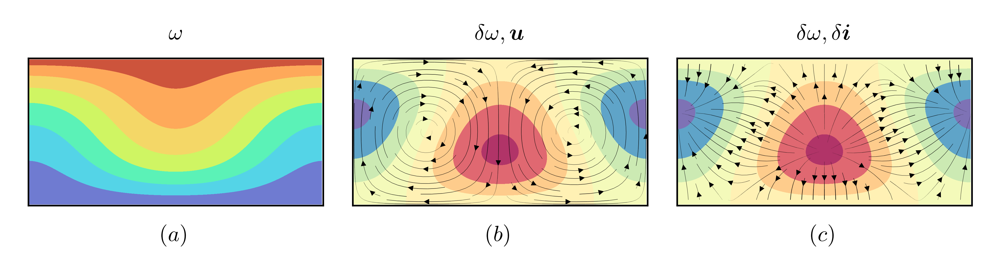

In [15]:
kw = { 'fratture_lw': 0.5, 'method': 'cubic', 'Nx': 512, 'cmap': cmap_w }

pb = pbs['0P']
c = pb._ultimo_steady_state[pb.dof['concentrazione']] - pb._primo_steady_state[pb.dof['concentrazione']]
vi = co.raccogli_stato_vec(pb.mdg, 'vi')
vi[1,:] += 1


fig = plt.figure(figsize=(linewidth, linewidth/2/3*1.5))
gs = fig.add_gridspec(nrows=3, ncols=3, width_ratios=[10, 10, 10], height_ratios=[1, 3.5, 1])

# ax = fig.add_subplot(gs[1,0])
# ax.set_aspect(10)
# cb = matplotlib.colorbar.ColorbarBase(ax, cmap=cmap_w, norm=matplotlib.colors.Normalize(vmin=0, vmax=1), orientation='vertical', ticks=np.linspace(0,1,11), ticklocation='left')
# ax.tick_params(labelsize='x-small')
# # cb.set_label(r'$\omega_{max}$')

# ax = fig.add_subplot(gs[1,4])
# ax.set_aspect(6)
# cb = matplotlib.colorbar.ColorbarBase(ax, cmap=cmap_dw, norm=matplotlib.colors.Normalize(vmin=-1, vmax=1), orientation='vertical', ticks=np.linspace(-1,1,11), ticklocation='right')
# ax.tick_params(labelsize='x-small')

plot_cells( pb, 'concentrazione', ax=fig.add_subplot(gs[1,0]), **kw)
# axs[1].set_title(r'$ \omega $')

ax = fig.add_subplot(gs[1,1])
plot_cells( pb, c, ax=ax, **kw|dict(cmap=cmap_dw))
streamplot( pb, 'vu', ax=ax, density=0.9, max_lw=0.2, soglia=0.05)
# axs[2].set_title(r'$ \delta\omega, \boldsymbol{u} $')

ax = fig.add_subplot(gs[1,2])
plot_cells( pb, c, ax=ax, **kw|dict(cmap=cmap_dw))
streamplot( pb, vi, ax=ax, density=0.9, max_lw=0.3)
# axs[3].set_title(r'$ \delta\omega, \delta \boldsymbol{i} $')


for i,t,u in zip(
    [0,1,2], 
    [
        r'$ \omega $',
        r'$ \delta\omega, \boldsymbol{u} $',
        r'$ \delta\omega, \delta \boldsymbol{i} $'
    ],
    [r'$(a)$',r'$(b)$',r'$(c)$']
):
    ax = fig.add_subplot(gs[0,i])
    ax.set_axis_off()
    ax.text(0.5, 0.3, t, va='bottom', ha='center', fontsize=11)
    
    ax = fig.add_subplot(gs[2,i])
    ax.set_axis_off()
    ax.text(0.5, 0.6, u, va='top', ha='center', fontsize=11)

fig.tight_layout(pad=0.1)
fig.savefig('../immagini/ra_new.png', **sf_kw)